# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
# data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

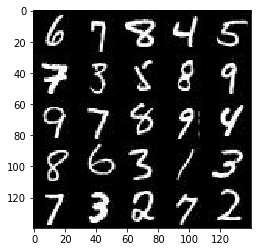

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

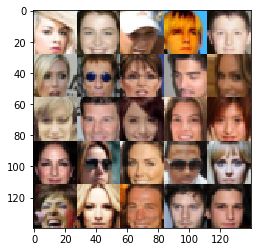

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.2.1
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real=tf.placeholder(tf.float32,(None,image_width,image_height,image_channels),name="input_real")
    input_z=tf.placeholder(tf.float32,(None,z_dim),name="z_dim")
    l_r=tf.placeholder(tf.float32,name="leaning_rate")

    return (input_real, input_z, l_r)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/home/bamboo/anaconda3/envs/jupyter_notebook/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/home/bamboo/anaconda3/envs/jupyter_notebook/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/home/bamboo/anaconda3/envs/jupyter_notebook/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/home/bamboo/anaconda3/envs/jupyter_notebook/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/home/bamboo/anaconda3/envs/jupyter_notebook/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 477, in start\n

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha=0.2
    with tf.variable_scope('discriminator',reuse=reuse):
        # Input layer is 28x28x3
        x1=tf.layers.conv2d(images,64,5,strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128

        
        # Flatten it
        flat = tf.reshape(relu2, (-1, 7*7*128))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return (out, logits)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha=0.2
    with tf.variable_scope('generator',reuse=(not is_train)):
        
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512) 
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256 now     

        # Output layer
        logits = tf.layers.conv2d_transpose(x2, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3 now
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [8]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth=0.1
    g_model = generator(input_z, out_channel_dim,is_train=True)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake    
    
    
    return (d_loss, g_loss)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [9]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]   
    
    # Optimize
# #     update_ops = tf.get_collection(False)
#     d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
#     with tf.control_dependencies([d_train_opt]):
# #         d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
#         g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)   

    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    with tf.control_dependencies(update_ops):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss,var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss,var_list=g_vars)  
    return (d_train_opt, g_train_opt)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [10]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [11]:

def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
#     tf.reset_default_graph()
    input_real,input_z,l_r=model_inputs(data_shape[1],data_shape[2],data_shape[3], z_dim)
    d_loss,g_loss=model_loss(input_real, input_z, data_shape[3])
    d_train_opt, g_train_opt=model_opt(d_loss, g_loss, l_r, beta1)
    
    saver = tf.train.Saver()

    losses = []
    steps = 0
    print_every=100
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                # TODO: Train Model
                # Sample random noise for G
                steps += 1
                batch_images=batch_images*2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                
                # Run optimizers
                _ = sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z,l_r:learning_rate})
                _ = sess.run(g_train_opt, feed_dict={input_z: batch_z, input_real: batch_images,l_r:learning_rate})
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                    
                if steps % print_every == 0:
                    
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                    
        saver.save(sess, './checkpoints/generator.ckpt')
    
    return losses

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/1... Discriminator Loss: 1.5978... Generator Loss: 0.5527


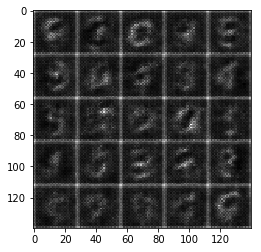

Epoch 1/1... Discriminator Loss: 1.4463... Generator Loss: 0.7972


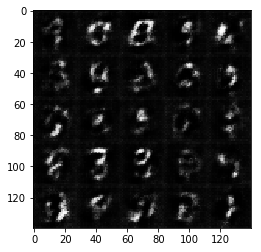

Epoch 1/1... Discriminator Loss: 1.2535... Generator Loss: 0.7811


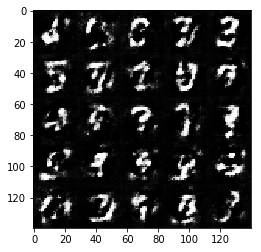

Epoch 1/1... Discriminator Loss: 1.1593... Generator Loss: 0.8787


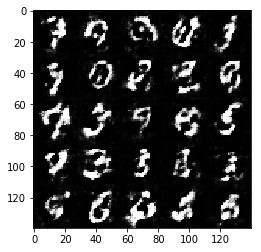

Epoch 1/1... Discriminator Loss: 1.2022... Generator Loss: 0.8062


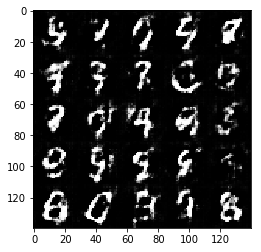

Epoch 1/1... Discriminator Loss: 1.1967... Generator Loss: 1.0535


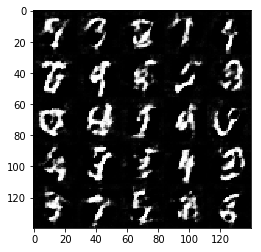

Epoch 1/1... Discriminator Loss: 1.1819... Generator Loss: 0.9846


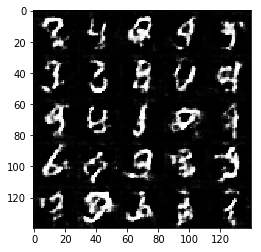

Epoch 1/1... Discriminator Loss: 1.2005... Generator Loss: 0.8742


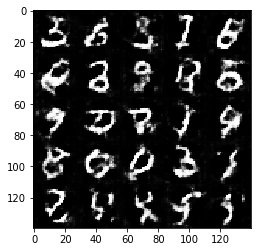

Epoch 1/1... Discriminator Loss: 1.3450... Generator Loss: 0.6313


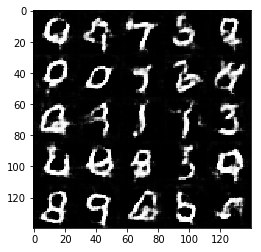

Epoch 1/1... Discriminator Loss: 1.3028... Generator Loss: 0.6710


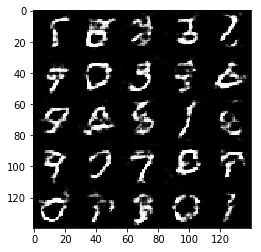

Epoch 1/1... Discriminator Loss: 1.3229... Generator Loss: 1.2404


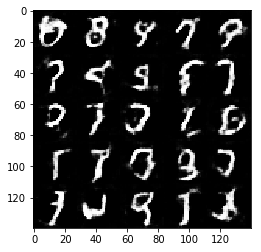

Epoch 1/1... Discriminator Loss: 1.2916... Generator Loss: 0.7266


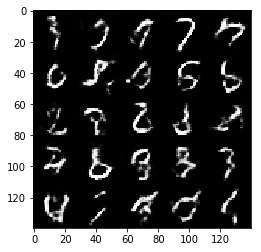

Epoch 1/1... Discriminator Loss: 1.2665... Generator Loss: 0.7339


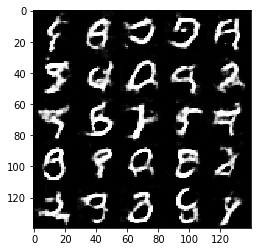

Epoch 1/1... Discriminator Loss: 1.1063... Generator Loss: 0.9952


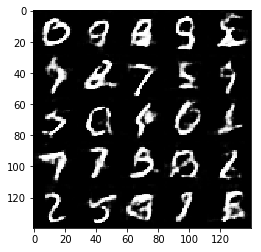

Epoch 1/1... Discriminator Loss: 1.1689... Generator Loss: 1.4917


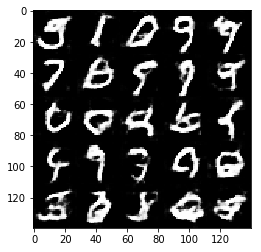

Epoch 1/1... Discriminator Loss: 1.1663... Generator Loss: 0.9623


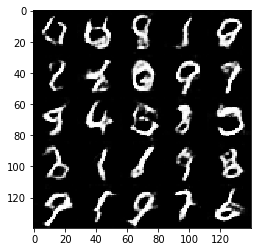

Epoch 1/1... Discriminator Loss: 1.2879... Generator Loss: 0.6589


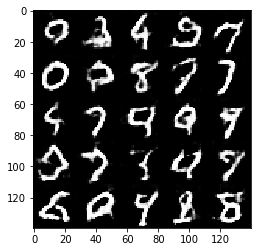

Epoch 1/1... Discriminator Loss: 1.1782... Generator Loss: 0.8205


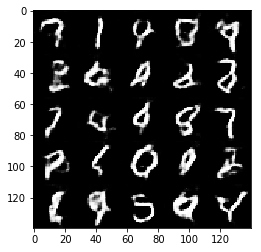

In [16]:
batch_size = 32
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
# print(mnist_dataset.shape)
# print(mnist_dataset.image_mode)
with tf.Graph().as_default():
    train(epochs
          , batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

(202599, 28, 28, 3)
Epoch 1/1... Discriminator Loss: 1.8490... Generator Loss: 0.4168


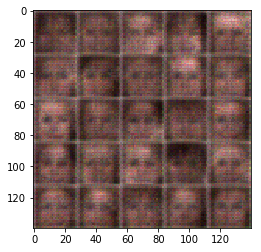

Epoch 1/1... Discriminator Loss: 1.4372... Generator Loss: 0.8147


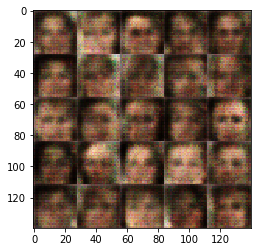

Epoch 1/1... Discriminator Loss: 0.8490... Generator Loss: 1.7178


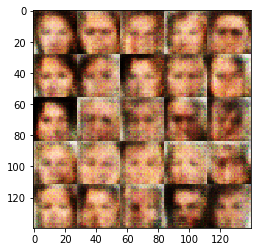

Epoch 1/1... Discriminator Loss: 0.8674... Generator Loss: 1.0593


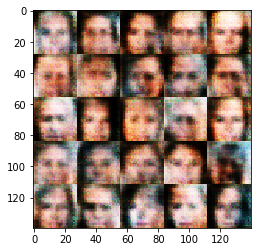

Epoch 1/1... Discriminator Loss: 0.5777... Generator Loss: 2.7741


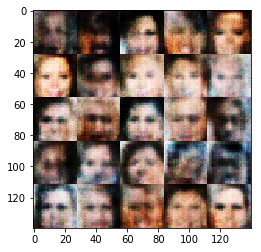

Epoch 1/1... Discriminator Loss: 0.7175... Generator Loss: 1.6879


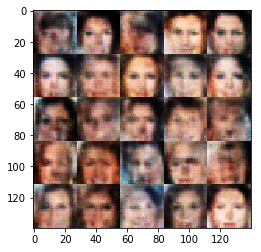

Epoch 1/1... Discriminator Loss: 1.6751... Generator Loss: 0.4990


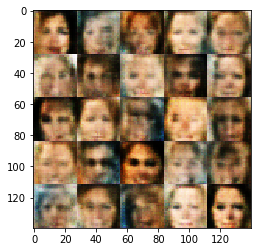

Epoch 1/1... Discriminator Loss: 0.6435... Generator Loss: 2.1627


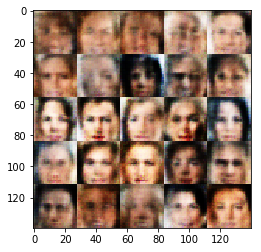

Epoch 1/1... Discriminator Loss: 1.3196... Generator Loss: 0.5960


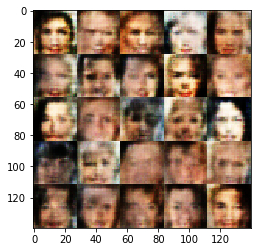

Epoch 1/1... Discriminator Loss: 1.3368... Generator Loss: 0.6762


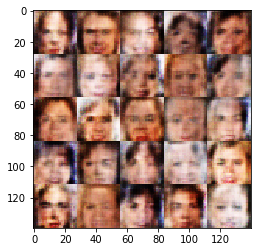

Epoch 1/1... Discriminator Loss: 0.9516... Generator Loss: 2.2471


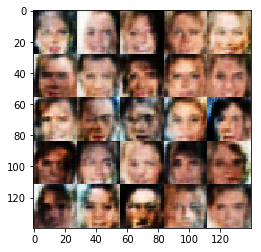

Epoch 1/1... Discriminator Loss: 1.2255... Generator Loss: 0.8448


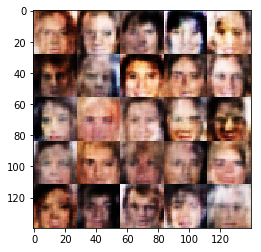

Epoch 1/1... Discriminator Loss: 0.8206... Generator Loss: 1.2939


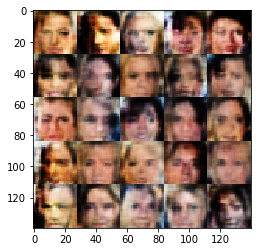

Epoch 1/1... Discriminator Loss: 1.1542... Generator Loss: 1.6569


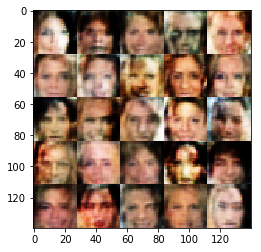

Epoch 1/1... Discriminator Loss: 0.8946... Generator Loss: 1.2016


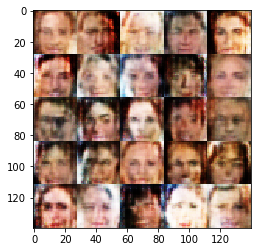

Epoch 1/1... Discriminator Loss: 1.3282... Generator Loss: 0.8292


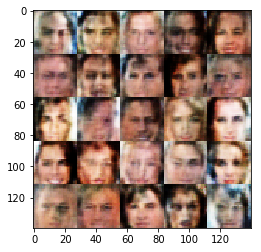

Epoch 1/1... Discriminator Loss: 0.4948... Generator Loss: 4.0211


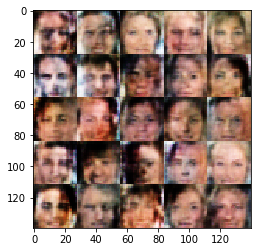

Epoch 1/1... Discriminator Loss: 0.6179... Generator Loss: 2.7590


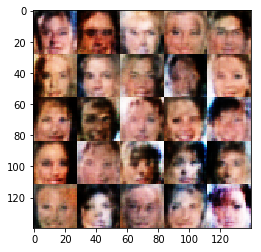

Epoch 1/1... Discriminator Loss: 0.6892... Generator Loss: 1.7683


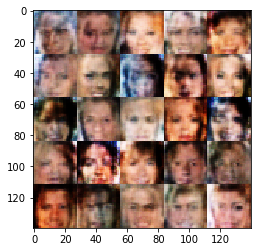

Epoch 1/1... Discriminator Loss: 1.2025... Generator Loss: 0.7230


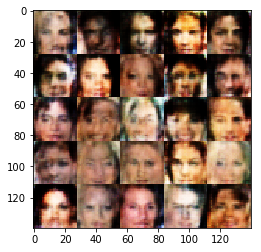

Epoch 1/1... Discriminator Loss: 0.9517... Generator Loss: 0.9912


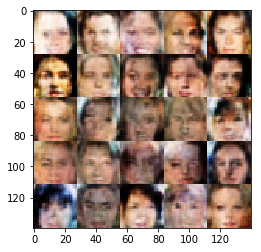

Epoch 1/1... Discriminator Loss: 1.3566... Generator Loss: 0.5286


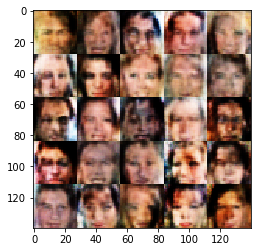

Epoch 1/1... Discriminator Loss: 1.1527... Generator Loss: 1.0681


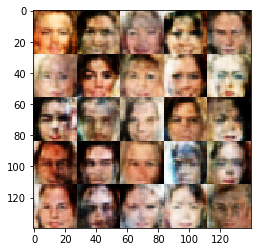

Epoch 1/1... Discriminator Loss: 1.6288... Generator Loss: 0.3612


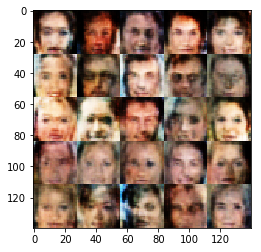

Epoch 1/1... Discriminator Loss: 1.3258... Generator Loss: 0.5258


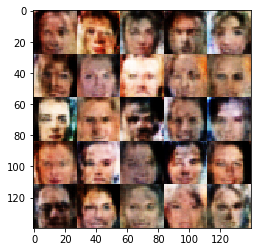

Epoch 1/1... Discriminator Loss: 0.7128... Generator Loss: 1.8734


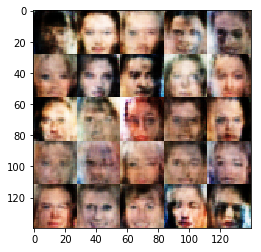

Epoch 1/1... Discriminator Loss: 0.5870... Generator Loss: 3.6625


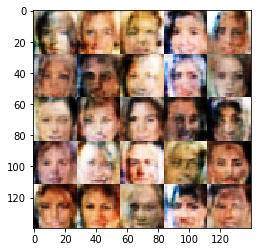

Epoch 1/1... Discriminator Loss: 0.5775... Generator Loss: 3.2793


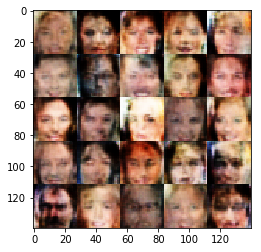

Epoch 1/1... Discriminator Loss: 0.4239... Generator Loss: 5.6520


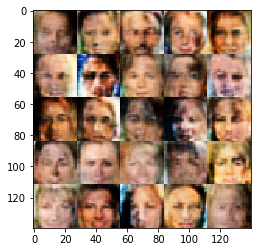

Epoch 1/1... Discriminator Loss: 0.6652... Generator Loss: 2.0932


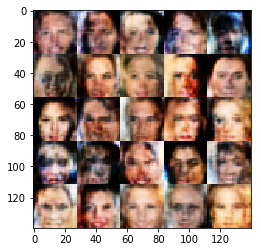

Epoch 1/1... Discriminator Loss: 0.4057... Generator Loss: 3.6912


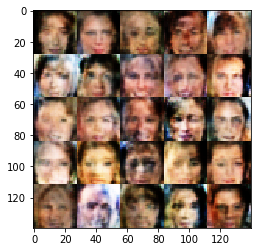

Epoch 1/1... Discriminator Loss: 0.6346... Generator Loss: 1.8366


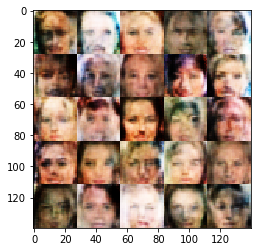

Epoch 1/1... Discriminator Loss: 0.5973... Generator Loss: 2.4159


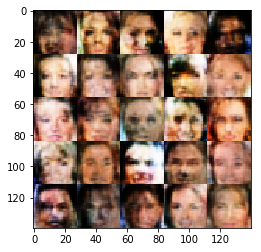

Epoch 1/1... Discriminator Loss: 0.8378... Generator Loss: 1.5597


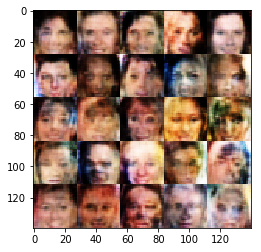

Epoch 1/1... Discriminator Loss: 0.6919... Generator Loss: 1.7910


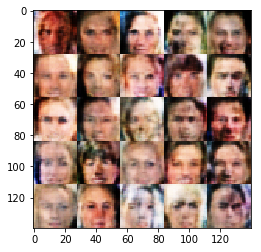

Epoch 1/1... Discriminator Loss: 1.6466... Generator Loss: 0.7865


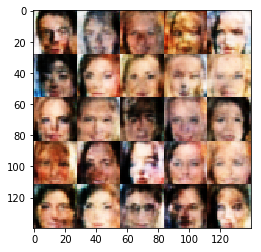

Epoch 1/1... Discriminator Loss: 1.0303... Generator Loss: 0.8779


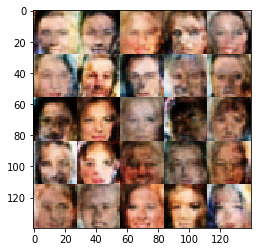

Epoch 1/1... Discriminator Loss: 0.6984... Generator Loss: 2.8055


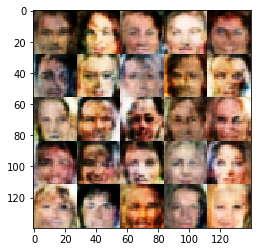

Epoch 1/1... Discriminator Loss: 0.5008... Generator Loss: 4.2529


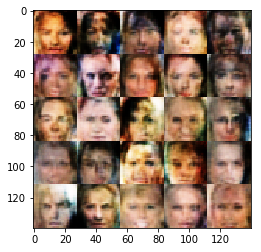

Epoch 1/1... Discriminator Loss: 1.2685... Generator Loss: 5.6526


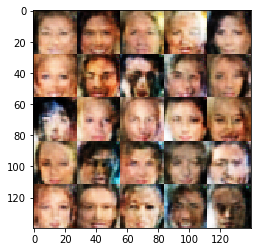

Epoch 1/1... Discriminator Loss: 0.5282... Generator Loss: 2.5027


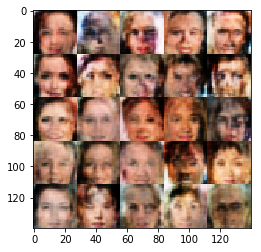

Epoch 1/1... Discriminator Loss: 0.6694... Generator Loss: 2.1725


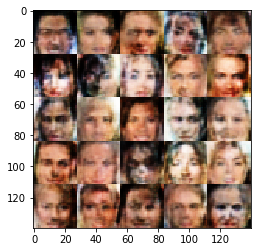

Epoch 1/1... Discriminator Loss: 0.4286... Generator Loss: 4.4316


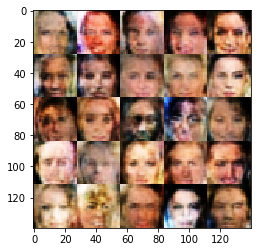

Epoch 1/1... Discriminator Loss: 0.5290... Generator Loss: 3.3248


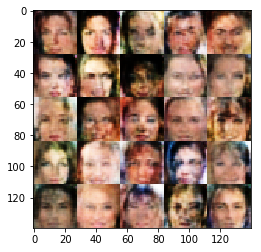

Epoch 1/1... Discriminator Loss: 0.7757... Generator Loss: 1.1888


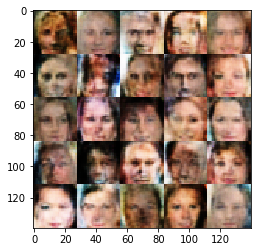

Epoch 1/1... Discriminator Loss: 1.4154... Generator Loss: 0.4922


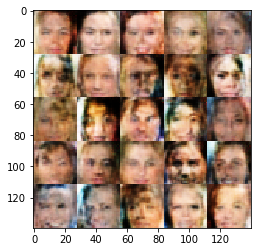

Epoch 1/1... Discriminator Loss: 0.8464... Generator Loss: 1.5401


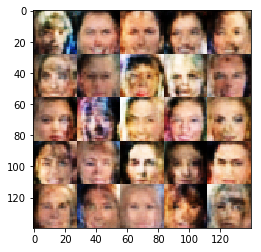

Epoch 1/1... Discriminator Loss: 0.6629... Generator Loss: 1.8354


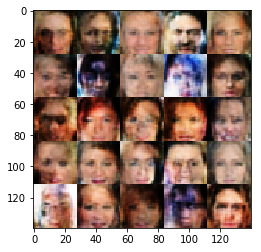

Epoch 1/1... Discriminator Loss: 1.2737... Generator Loss: 1.0039


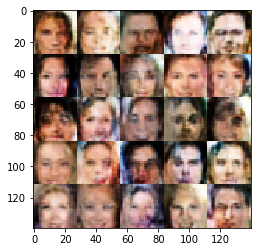

Epoch 1/1... Discriminator Loss: 0.8748... Generator Loss: 1.1350


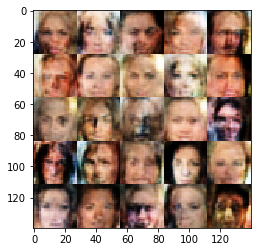

Epoch 1/1... Discriminator Loss: 0.5579... Generator Loss: 2.4370


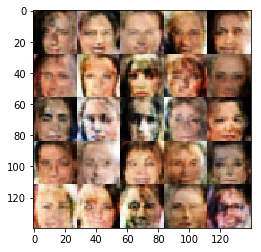

Epoch 1/1... Discriminator Loss: 0.9913... Generator Loss: 1.1398


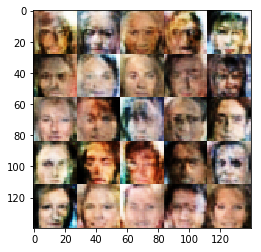

Epoch 1/1... Discriminator Loss: 1.0181... Generator Loss: 1.0328


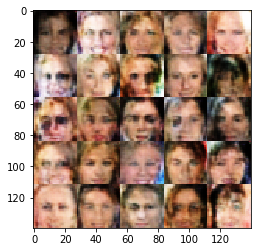

Epoch 1/1... Discriminator Loss: 0.4289... Generator Loss: 4.6089


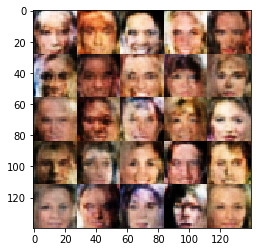

Epoch 1/1... Discriminator Loss: 0.9028... Generator Loss: 1.4505


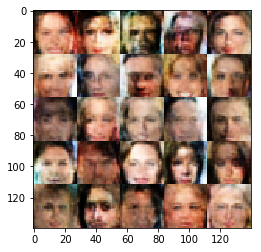

Epoch 1/1... Discriminator Loss: 0.4675... Generator Loss: 3.5512


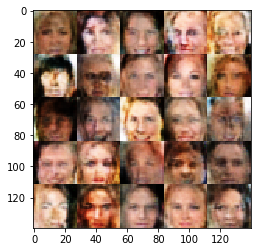

Epoch 1/1... Discriminator Loss: 0.5672... Generator Loss: 3.6992


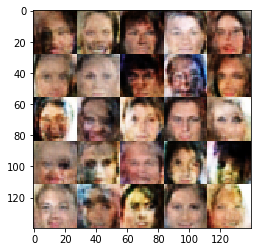

Epoch 1/1... Discriminator Loss: 0.7774... Generator Loss: 2.1949


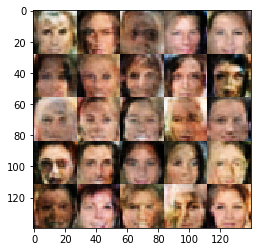

Epoch 1/1... Discriminator Loss: 0.6522... Generator Loss: 2.6682


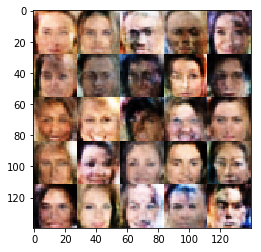

Epoch 1/1... Discriminator Loss: 0.7414... Generator Loss: 1.8169


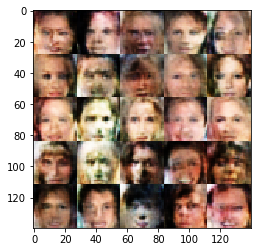

Epoch 1/1... Discriminator Loss: 0.7346... Generator Loss: 1.4217


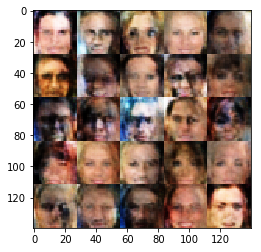

Epoch 1/1... Discriminator Loss: 0.6253... Generator Loss: 2.2444


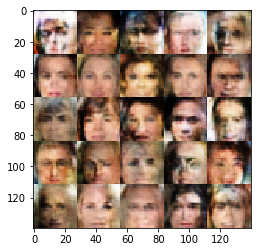

Epoch 1/1... Discriminator Loss: 0.5668... Generator Loss: 3.6056


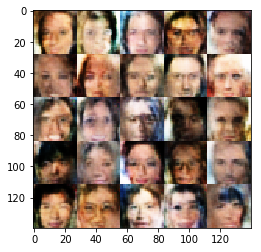

Epoch 1/1... Discriminator Loss: 0.6842... Generator Loss: 1.4452


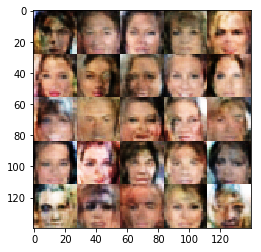

Epoch 1/1... Discriminator Loss: 0.8922... Generator Loss: 1.1396


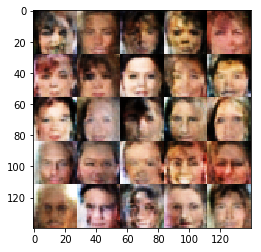

Epoch 1/1... Discriminator Loss: 0.8475... Generator Loss: 1.3473


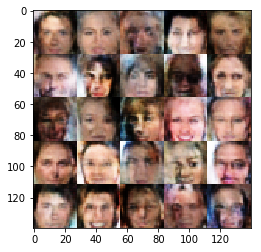

Epoch 1/1... Discriminator Loss: 0.6144... Generator Loss: 3.0588


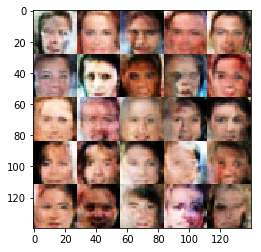

Epoch 1/1... Discriminator Loss: 0.8662... Generator Loss: 4.5255


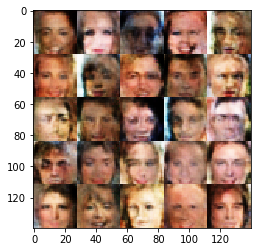

Epoch 1/1... Discriminator Loss: 0.8947... Generator Loss: 1.2347


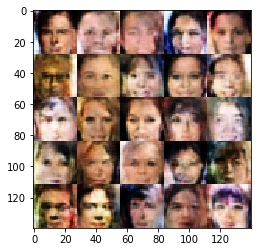

Epoch 1/1... Discriminator Loss: 0.6543... Generator Loss: 1.9135


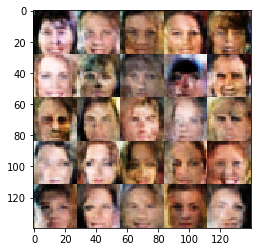

Epoch 1/1... Discriminator Loss: 0.5530... Generator Loss: 3.2687


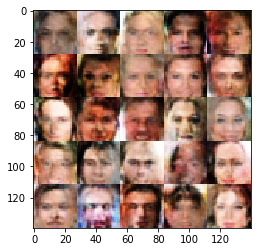

Epoch 1/1... Discriminator Loss: 0.7817... Generator Loss: 1.8178


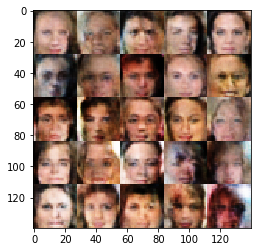

Epoch 1/1... Discriminator Loss: 0.9113... Generator Loss: 1.8553


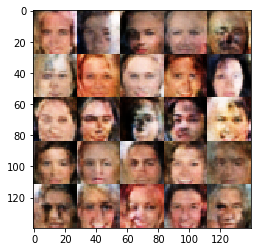

Epoch 1/1... Discriminator Loss: 0.5953... Generator Loss: 2.0638


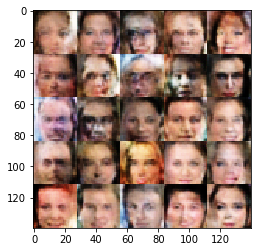

Epoch 1/1... Discriminator Loss: 0.9982... Generator Loss: 0.8888


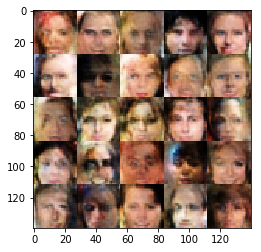

Epoch 1/1... Discriminator Loss: 1.0250... Generator Loss: 1.4089


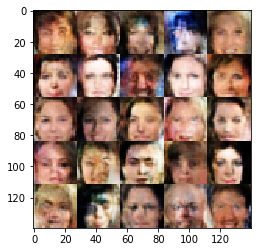

Epoch 1/1... Discriminator Loss: 0.9263... Generator Loss: 1.1590


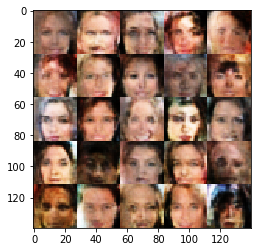

Epoch 1/1... Discriminator Loss: 0.8012... Generator Loss: 1.2476


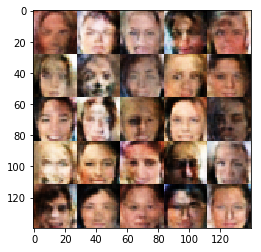

Epoch 1/1... Discriminator Loss: 0.3590... Generator Loss: 7.8232


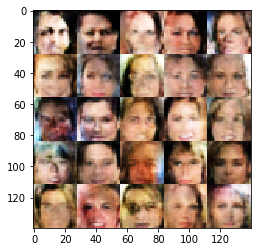

Epoch 1/1... Discriminator Loss: 0.7043... Generator Loss: 2.0614


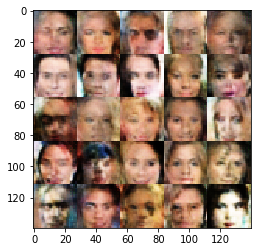

Epoch 1/1... Discriminator Loss: 1.2780... Generator Loss: 0.8164


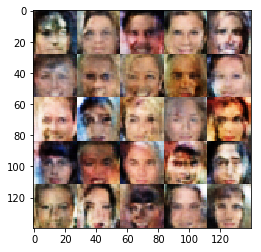

Epoch 1/1... Discriminator Loss: 0.7617... Generator Loss: 1.9004


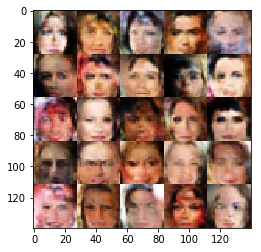

Epoch 1/1... Discriminator Loss: 0.7356... Generator Loss: 2.9055


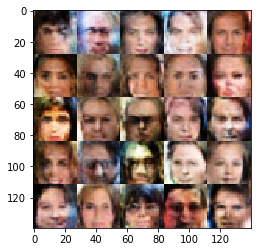

Epoch 1/1... Discriminator Loss: 1.1662... Generator Loss: 0.7467


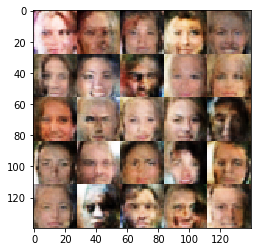

Epoch 1/1... Discriminator Loss: 0.7787... Generator Loss: 1.6765


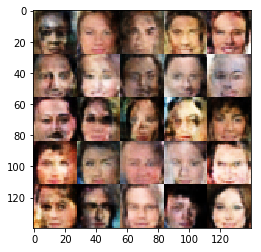

Epoch 1/1... Discriminator Loss: 0.8079... Generator Loss: 1.3322


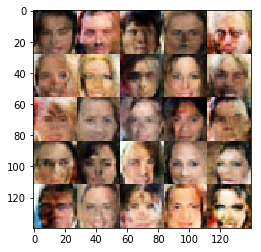

Epoch 1/1... Discriminator Loss: 0.7176... Generator Loss: 2.0911


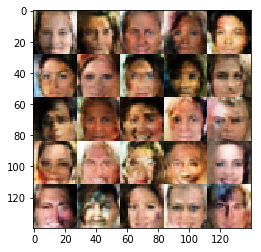

Epoch 1/1... Discriminator Loss: 0.9187... Generator Loss: 1.3515


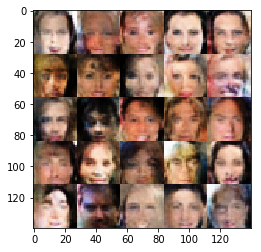

Epoch 1/1... Discriminator Loss: 0.8407... Generator Loss: 2.1392


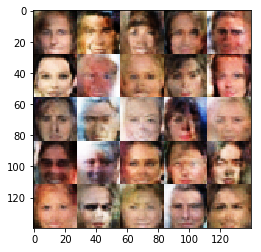

Epoch 1/1... Discriminator Loss: 1.0633... Generator Loss: 1.0270


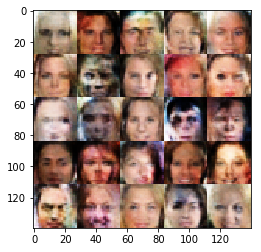

Epoch 1/1... Discriminator Loss: 1.0800... Generator Loss: 0.9061


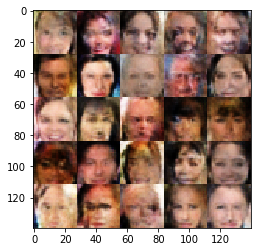

Epoch 1/1... Discriminator Loss: 0.8977... Generator Loss: 1.2356


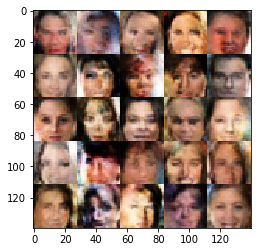

Epoch 1/1... Discriminator Loss: 0.7991... Generator Loss: 1.5030


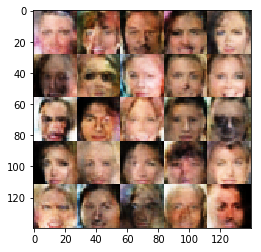

Epoch 1/1... Discriminator Loss: 1.1937... Generator Loss: 0.7784


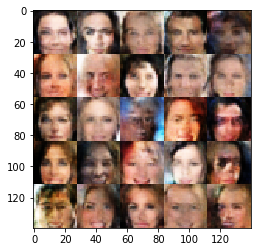

Epoch 1/1... Discriminator Loss: 0.8420... Generator Loss: 1.5613


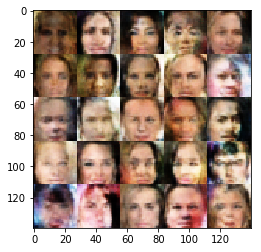

Epoch 1/1... Discriminator Loss: 0.9939... Generator Loss: 1.1934


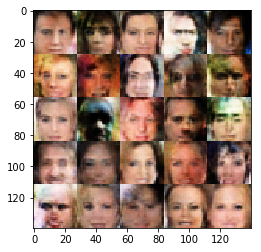

Epoch 1/1... Discriminator Loss: 1.2827... Generator Loss: 0.5940


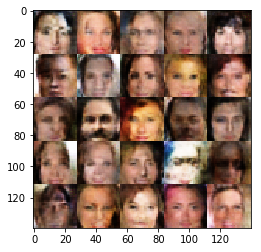

Epoch 1/1... Discriminator Loss: 1.1348... Generator Loss: 1.4212


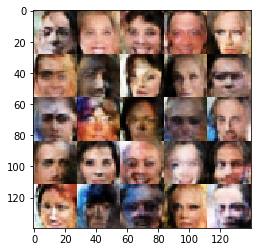

Epoch 1/1... Discriminator Loss: 1.0062... Generator Loss: 1.1145


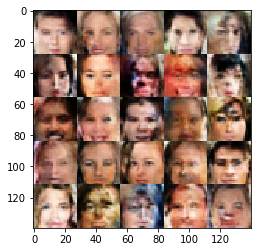

Epoch 1/1... Discriminator Loss: 1.2137... Generator Loss: 0.7286


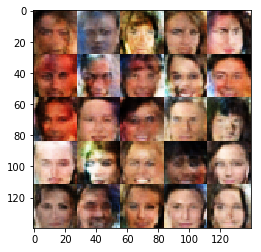

Epoch 1/1... Discriminator Loss: 1.0511... Generator Loss: 0.9296


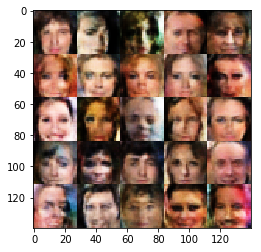

Epoch 1/1... Discriminator Loss: 0.7836... Generator Loss: 1.5088


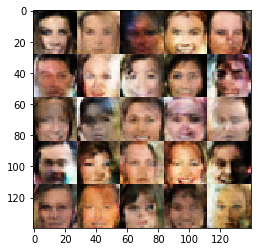

Epoch 1/1... Discriminator Loss: 0.9579... Generator Loss: 0.9896


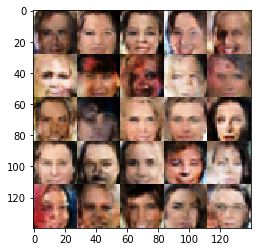

Epoch 1/1... Discriminator Loss: 1.1643... Generator Loss: 0.7975


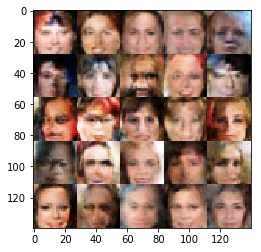

Epoch 1/1... Discriminator Loss: 0.6335... Generator Loss: 2.5273


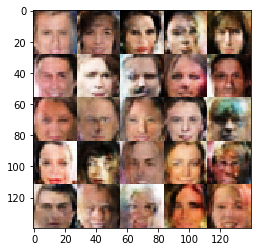

Epoch 1/1... Discriminator Loss: 0.6366... Generator Loss: 2.8209


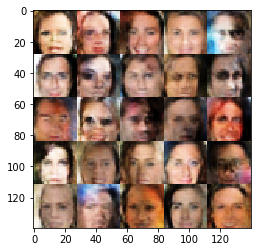

Epoch 1/1... Discriminator Loss: 0.9310... Generator Loss: 1.0730


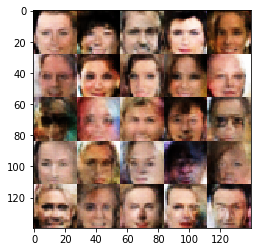

Epoch 1/1... Discriminator Loss: 0.9123... Generator Loss: 1.4748


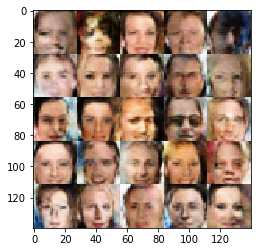

Epoch 1/1... Discriminator Loss: 0.9452... Generator Loss: 1.2379


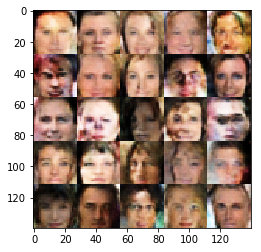

Epoch 1/1... Discriminator Loss: 0.7879... Generator Loss: 1.4631


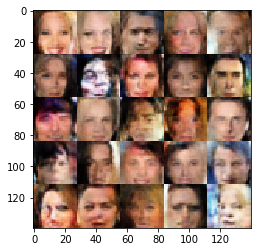

Epoch 1/1... Discriminator Loss: 0.8842... Generator Loss: 1.5220


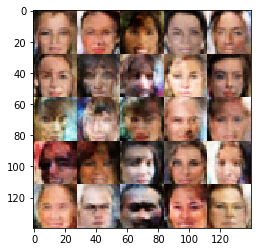

Epoch 1/1... Discriminator Loss: 1.3549... Generator Loss: 0.7293


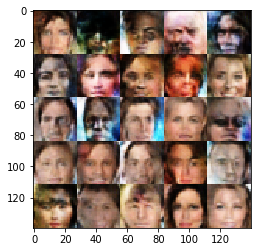

Epoch 1/1... Discriminator Loss: 0.9364... Generator Loss: 2.5001


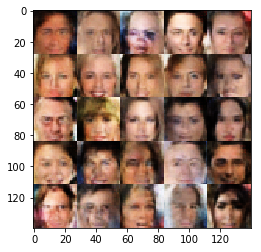

Epoch 1/1... Discriminator Loss: 0.7403... Generator Loss: 1.5305


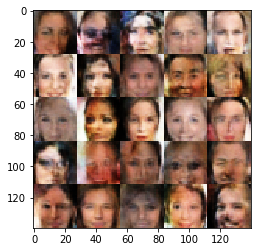

Epoch 1/1... Discriminator Loss: 1.0897... Generator Loss: 0.7474


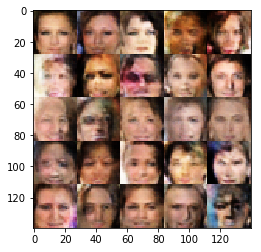

Epoch 1/1... Discriminator Loss: 1.1502... Generator Loss: 1.1626


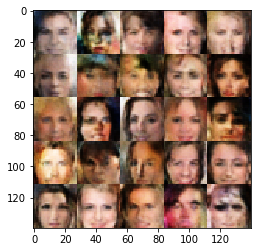

Epoch 1/1... Discriminator Loss: 0.8580... Generator Loss: 2.6377


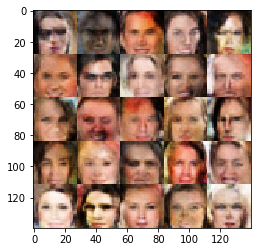

Epoch 1/1... Discriminator Loss: 1.0167... Generator Loss: 0.9890


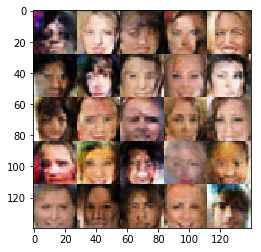

Epoch 1/1... Discriminator Loss: 1.0274... Generator Loss: 1.4158


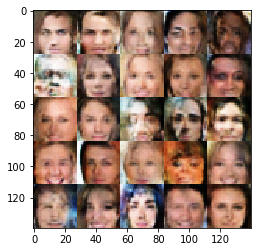

Epoch 1/1... Discriminator Loss: 0.9696... Generator Loss: 1.2260


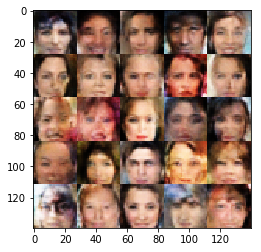

Epoch 1/1... Discriminator Loss: 1.0633... Generator Loss: 1.2245


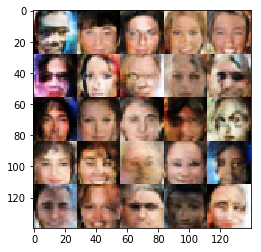

Epoch 1/1... Discriminator Loss: 1.1654... Generator Loss: 0.8875


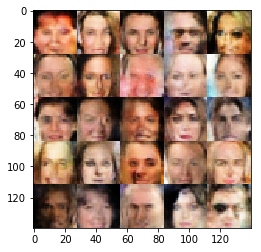

Epoch 1/1... Discriminator Loss: 0.7586... Generator Loss: 2.0023


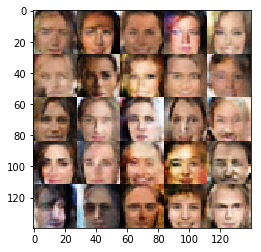

Epoch 1/1... Discriminator Loss: 0.9863... Generator Loss: 1.2039


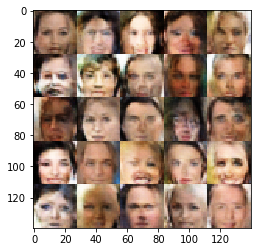

Epoch 1/1... Discriminator Loss: 1.0183... Generator Loss: 0.9648


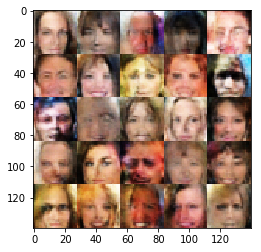

Epoch 1/1... Discriminator Loss: 1.1642... Generator Loss: 0.7547


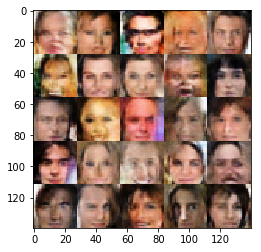

In [ ]:
batch_size = 16
z_dim = 100
learning_rate = 0.00025
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
print(celeba_dataset.shape)
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.